In [1]:
!pip install -q sentence_transformers

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.0/86.0 kB 3.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.0/7.0 MB 104.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 77.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.5/224.5 kB 28.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 105.1 MB/s eta 0:00:00


In [2]:
!wget -q https://github.com/vantral/files/raw/main/winemag-data-130k-v2.zip
!unzip winemag-data-130k-v2.zip

Archive:  winemag-data-130k-v2.zip
  inflating: winemag-data-130k-v2.csv  


In [3]:
import pandas as pd
from sentence_transformers import SentenceTransformer
from sklearn.preprocessing import LabelEncoder
from tqdm.notebook import tqdm
import plotly.graph_objects as go

model = SentenceTransformer('all-MiniLM-L6-v2', device='cuda')

In [4]:
df = pd.read_csv('winemag-data-130k-v2.csv', index_col = [0])

In [5]:
data = df[
    [
        'country', 'description', 'price', 'points', 'province',
        'region_1', 'taster_name', 'variety', 'winery'
    ]
]

In [6]:
encoder = LabelEncoder()
encode = encoder.fit_transform

data_vectorized = pd.DataFrame(
    dict(
        country=encode(data.country),
        price=data.price.fillna(-1),
        points=data.points.fillna(-1),
        province=encode(data.province),
        region=encode(data.region_1),
        taster_name=encode(data.taster_name),
        variety=encode(data.variety),
        winery=encode(data.winery)
        )
    )

In [7]:
embeddings = model.encode(data.description)

In [8]:
data_vectorized = pd.concat([data_vectorized, pd.Series(list(embeddings)).apply(pd.Series)], axis=1)

In [9]:
from sklearn.preprocessing import StandardScaler

std_scaler = StandardScaler()
data_scaled = data_vectorized.copy()
data_scaled.columns = data_scaled.columns.astype(str)
data_scaled[data_scaled.columns] = std_scaler.fit_transform(data_scaled)

In [10]:
from sklearn.decomposition import PCA
pca_2 = PCA(2)

data_scaled_pca = pca_2.fit_transform(data_scaled)

In [11]:
import sklearn.cluster as cluster
from sklearn.metrics import silhouette_score

inertia = {}
silhouette = {}

for i in tqdm(range(2, 15)):
    kmeans = cluster.KMeans(
        n_clusters=i,
        n_init=15,
        init='k-means++',
        max_iter=500,
        random_state=42
    )

    kmeans.fit(data_scaled_pca)
    inertia[i] = kmeans.inertia_
    silhouette[i] = silhouette_score(
        data_scaled_pca,
        kmeans.labels_,
        metric='euclidean'
    )

  0%|          | 0/13 [00:00<?, ?it/s]

In [12]:
import matplotlib.pyplot as plt

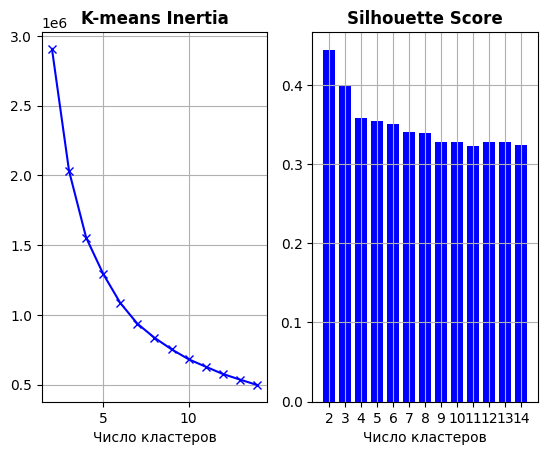

In [13]:
plt.subplot(1, 2, 1) # аргументы: nrows, ncols, index

plt.plot(inertia.keys(), inertia.values(), marker='x',color='blue') 
# первый параметр = x (число шагов= числу кластеров), второй = y (инерция)

plt.xlabel('Число кластеров')
plt.title('K-means Inertia',fontweight='bold')
plt.grid(True)

plt.subplot(1, 2, 2) # аргументы: nrows, ncols, index

plt.bar(range(len(silhouette)), list(silhouette.values()), align='center',color= 'blue')
plt.xticks(range(len(silhouette)), list(silhouette.keys())) # отметки на шкале
plt.grid(True)
plt.title('Silhouette Score',fontweight='bold')
plt.xlabel('Число кластеров')


plt.show()

Сложно выбрать: наибольший силуэт скор для двух, потом довольно резко падает, в голове можно держать, что два и три кластера -- это ещё нормально, больше -- уже точно плохо.

In [14]:
kmeans = cluster.KMeans(
        n_clusters=2,
        n_init=15,
        init='k-means++',
        max_iter=500,
        random_state=42
    )

kmeans_labels = kmeans.fit_predict(data_scaled_pca)

In [15]:
data_scaled['cluster'] = kmeans_labels.astype(str)

pca_2_df = pd.DataFrame(data_scaled_pca)
pca_2_df['cluster'] = kmeans_labels.astype(str)

In [16]:
data_scaled_pca_vis = pca_2_df.sample(30000)

texts = []
for row in data.iloc[data_scaled_pca_vis.index,].iterrows():
    texts.append(
        f'country: {row[1].country}<br>description: {row[1].description[:100]}'\
        f'<br>price: {row[1].price}<br>points: {row[1].points}<br>province: '\
        f'{row[1].province}<br>region: {row[1].region_1}<br>taster: '\
        f'{row[1].taster_name}<br>variety: {row[1].variety}<br>winery: '\
        f'{row[1].winery}'
    )

In [17]:
fig = go.Figure(data=go.Scatter(x=data_scaled_pca_vis[0],
                                y=data_scaled_pca_vis[1],
                                mode='markers'))

fig.update_layout(
    title='Распределение данных по двум главным компонентам',
    xaxis_title="PC1",
    yaxis_title="PC2",
)

fig.show()

Глазами так сразу и не скажешь, что тут вообще есть кластеры. Хотя может быть два и найдётся: слева и справа. Поэтому буду считать, что нужно попробовать kmeans для двух кластеров. Задача кластеризации отзывов не очень чёткая: у нас нет гипотезы, которую мы проверяем, поэтому непонятно на основании какого признака (заранее не включённого в датасет) отзывы должны скучковаться.

In [18]:
fig = go.Figure(data=go.Scatter(x=data_scaled_pca_vis[0],
                                y=data_scaled_pca_vis[1],
                                mode='markers',
                                marker_color=data_scaled_pca_vis['cluster'].astype(int),
                                text=texts))

fig.update_layout(
    title='Кластеризация данных по двум главным компонентам',
    xaxis_title="PC1",
    yaxis_title="PC2",
)

fig.show()

Про каждый отзыв отсюда на визуализации можно посмотреть всю информацию. Из-за того, что данных очень много так сходу и не скажешь, по какому принципу они разделены.

In [19]:
from sklearn.cluster import DBSCAN

In [20]:
X = data_scaled.drop("cluster",axis=1)
cluster = DBSCAN(min_samples=2, eps=0.5) 
cluster.fit(X)

DBSCAN(min_samples=2)

In [21]:
data_scaled['cluster_db'] = cluster.labels_
data_scaled['cluster_db'].value_counts()

-1       109988
 1758         3
 6664         2
 6657         2
 6658         2
          ...  
 3331         2
 3332         2
 3333         2
 3334         2
 9990         2
Name: cluster_db, Length: 9992, dtype: int64

In [22]:
pca_2_df['cluster_db'] = cluster.labels_.astype(str)

In [23]:
pca_2_df

,0,1,cluster,cluster_db
0,9.189220,-1.423951,0,-1
1,-7.018820,-4.259467,1,-1
2,0.755606,-3.682228,0,-1
3,8.854152,-3.598630,0,-1
4,-5.747640,5.074260,1,-1
...,...,...,...,...
129966,6.717283,-0.507881,0,-1
129967,1.624778,-2.688758,0,-1
129968,-9.686659,-2.168441,1,-1
129969,-4.045378,-0.694991,1,-1


In [24]:
data_scaled_pca_vis = pca_2_df.sample(5000)

texts = []
for row in data.iloc[data_scaled_pca_vis.index,].iterrows():
    texts.append(
        f'country: {row[1].country}<br>description: {row[1].description[:100]}'\
        f'<br>price: {row[1].price}<br>points: {row[1].points}<br>province: '\
        f'{row[1].province}<br>region: {row[1].region_1}<br>taster: '\
        f'{row[1].taster_name}<br>variety: {row[1].variety}<br>winery: '\
        f'{row[1].winery}'
    )

In [25]:
fig = go.Figure(data=go.Scatter(x=data_scaled_pca_vis[0],
                                y=data_scaled_pca_vis[1],
                                mode='markers',
                                marker_color=data_scaled_pca_vis['cluster_db'].astype(int),
                                text=texts))

fig.update_layout(
    title='Кластеризация данных по двум главным компонентам',
    xaxis_title="PC1",
    yaxis_title="PC2",
)

fig.show()

DBSCAN сработал плохо. Оно и не мудрено -- все данные располагаются очень плотно, поэтому попадают в один кластер с вкраплениями других. Хотя может быть это и хороший результат, который говорит о том, что кластеров в этих данных искать не стоит.

Для dbscan нет особенного смысла считать инерцию, поэтому посчитаю только силуэты. 

In [27]:
silhouette_score(
        data_scaled_pca,
        cluster.labels_,
        metric='euclidean'
    )

-0.6830807206320472

Отрицательный силуэт скор это очень плохо..